# **Steerable Pyramids**

The Steerable Pyramid is a Multi-Scale, Multi-Orientation linear image decomposition that provides highly localized information. THe transform is overcomplete meaning that it contains more than enough information to reconstruct the original image. In this notebook we will explore the Steerable Pyramid by example.

The images created for the Medium tutorial are at the very bottom

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from test_image import *
from steerable_pyramid import SteerablePyramid

%matplotlib inline

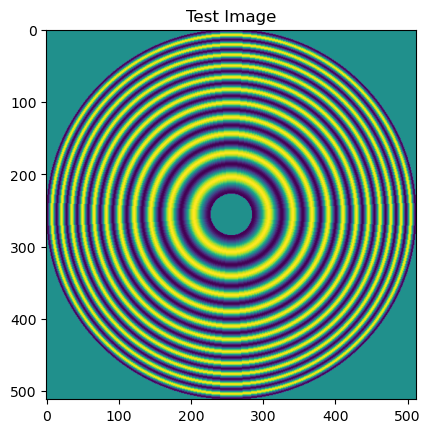

In [68]:
from skimage.data import camera

image = get_test_image(512, f1)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

# image = camera()

plt.imshow(image)
plt.title("Test Image");

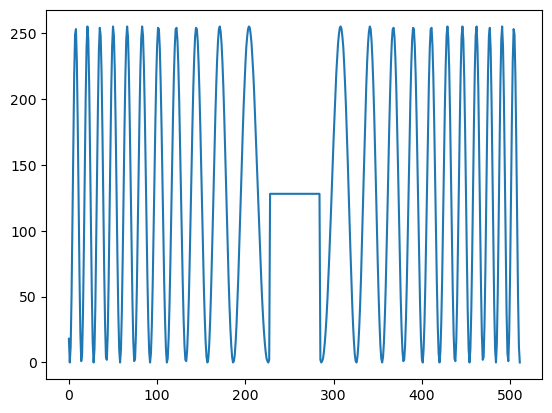

In [69]:
plt.plot(image[256, :]);

## Get Steerable Pyramid Class

In [70]:
pyr = SteerablePyramid(depth=4, orientations=4, twidth=1.0, complex_pyr=False)

In [71]:
# get Steerable Pyramid Filters
# filters, crops = pyr.get_filters(image, cropped=True)
filters, crops = pyr.get_filters(image, cropped=False)

# get Steerable Pyramid Decomposition in Spatial Domain
# pyramid = pyr.build_pyramid(image, filters, crops)
pyramid = pyr.build_pyramid_full(image, filters)

# reconstruct original image from pyramid decomposition
# recon_dft = pyr.reconstruct_image_dft(pyramid, filters, crops)
recon_dft = pyr.reconstruct_image_dft_full(pyramid, filters)

### Display Results

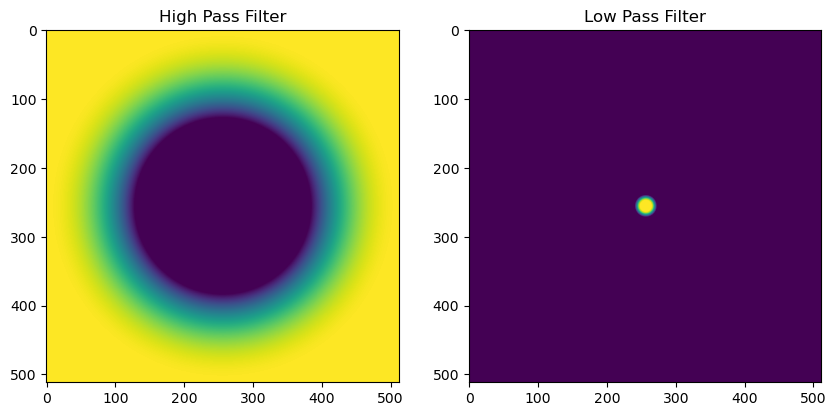

In [72]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(filters[0]);
ax[0].set_title("High Pass Filter");

ax[1].imshow(filters[-1]);
ax[1].set_title("Low Pass Filter");

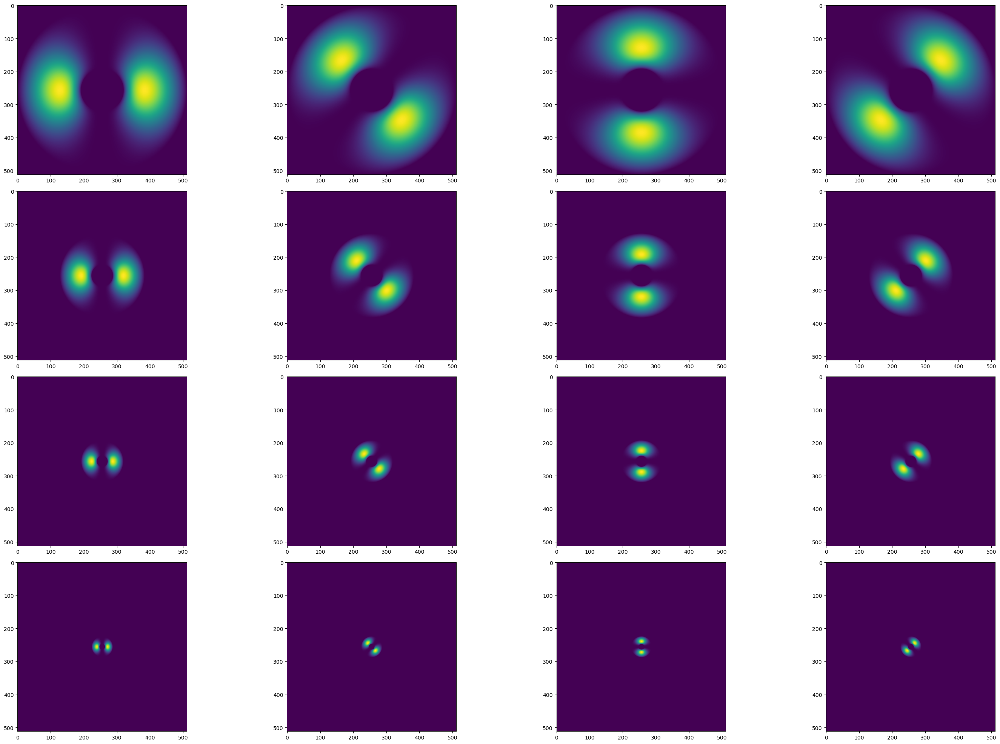

In [73]:
pyr.display(filters);

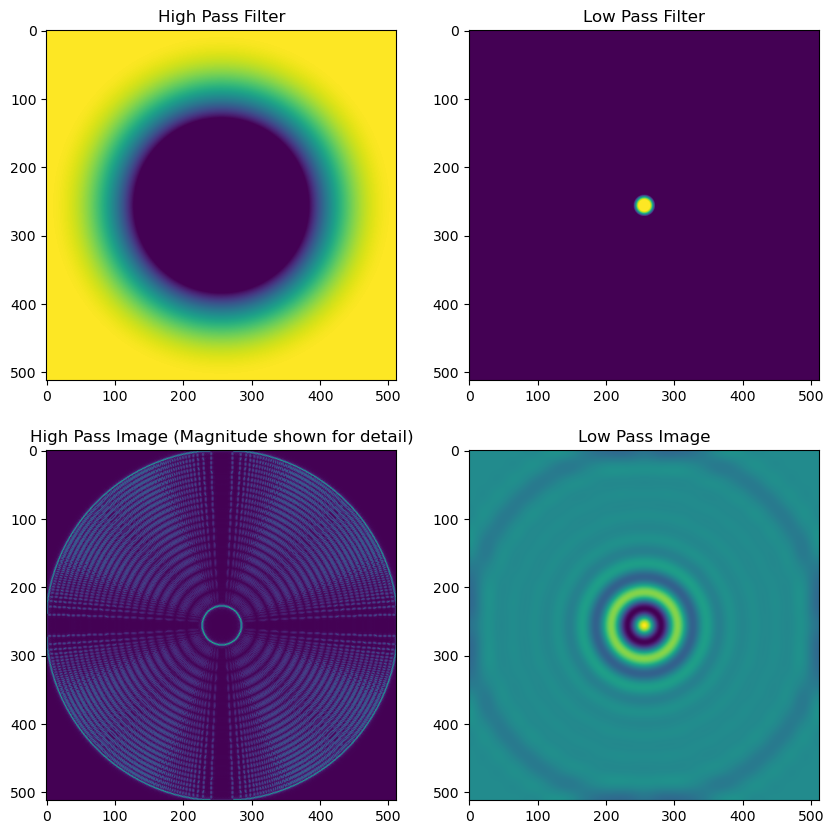

In [74]:
_, ax = plt.subplots(2, 2, figsize=(10, 10))
ax[0, 0].imshow(filters[0]);
ax[0, 0].set_title("High Pass Filter");

ax[0, 1].imshow(filters[-1]);
ax[0, 1].set_title("Low Pass Filter");

ax[1, 0].imshow(np.abs(pyramid[0].real));
ax[1, 0].set_title("High Pass Image (Magnitude shown for detail)");

ax[1, 1].imshow(np.real(pyramid[-1]));
ax[1, 1].set_title("Low Pass Image");

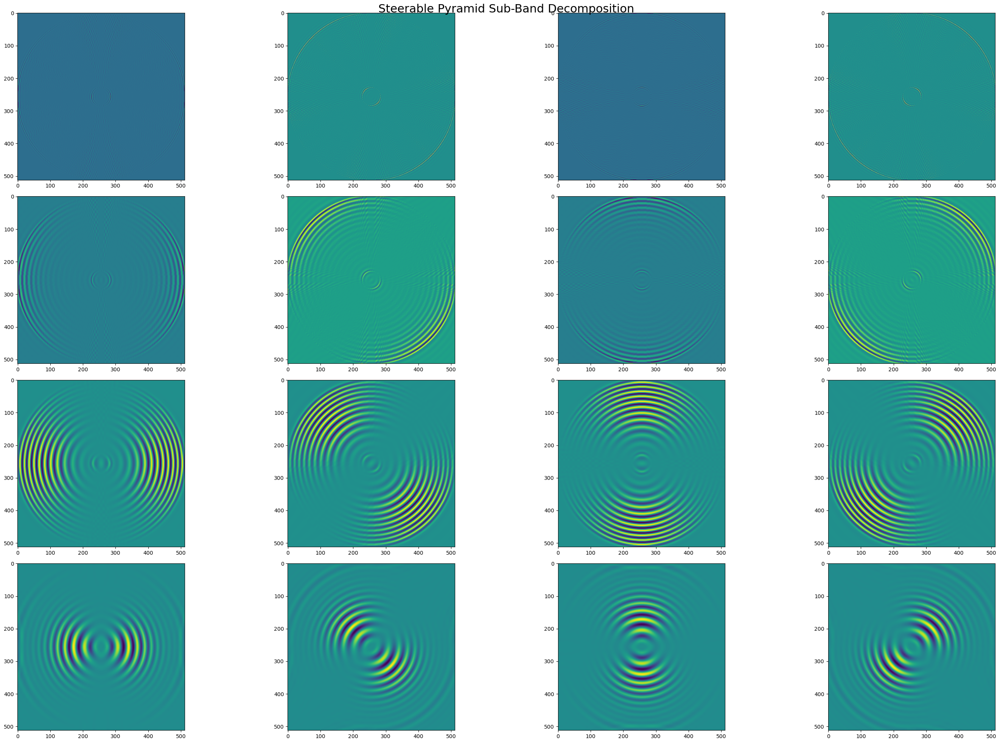

In [75]:
pyr.display(pyramid, title="Steerable Pyramid Sub-Band Decomposition");

### Get Reconstructed Image DFT

In [76]:
image_dft = np.fft.fftshift(np.fft.fft2(image))

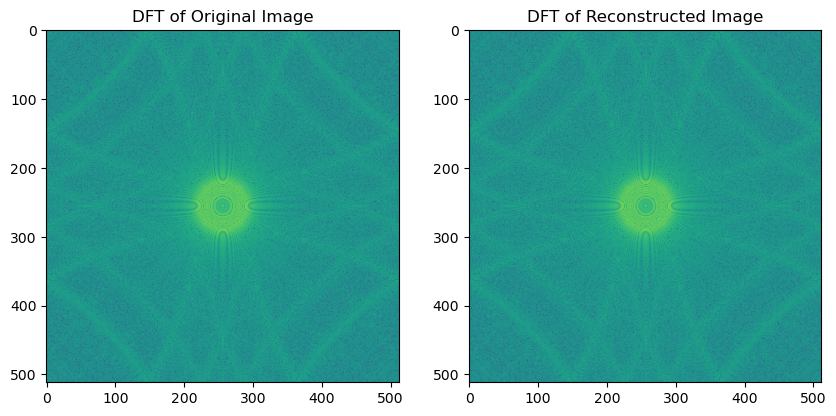

In [77]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.log(np.abs(image_dft)));
ax[0].set_title("DFT of Original Image");

ax[1].imshow(np.log(np.abs(recon_dft)));
ax[1].set_title("DFT of Reconstructed Image");

### Get reconstructed image

In [78]:
recon = np.fft.ifft2(np.fft.ifftshift(recon_dft)).real

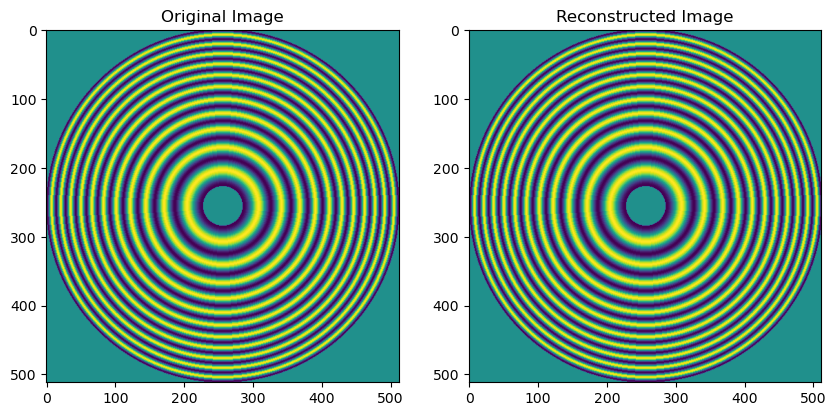

In [79]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(image);
ax[0].set_title("Original Image");

ax[1].imshow(recon);
ax[1].set_title("Reconstructed Image");

Check the differences

In [80]:
np.sum(np.abs(recon - image)), np.mean(np.square(recon - image))

(5.642258518987056e-09, 8.97503274186066e-28)

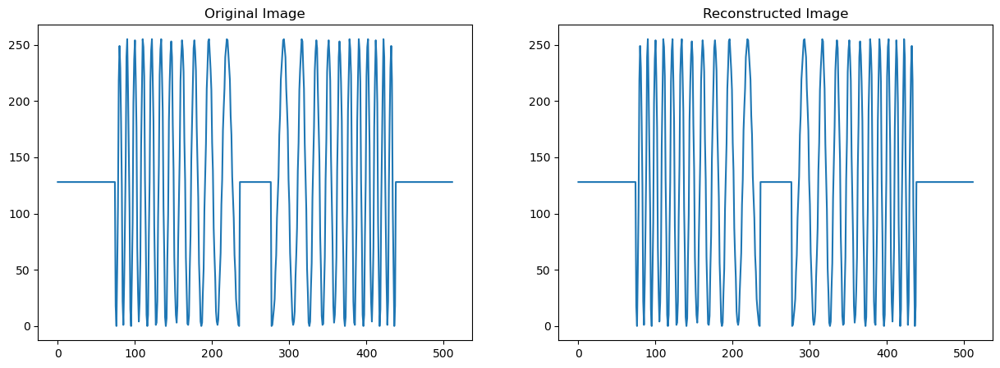

In [81]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.diag(image));
ax[0].set_title("Original Image");

ax[1].plot(np.diag(recon))
ax[1].set_title("Reconstructed Image");

#### **Produce the Tutorial Images**

In [82]:
def get_polar_grid(h, w):
    """ Obtains Angle and Radius of Polar grid
        Inputs:
            h, w - input image height and width
        Outputs:
            angle - Angluar Component of Polar Grid
            radius - Radial component of Polar Grid
    """
    # Get grid for cosine ramp function
    h2 = h//2
    w2 = w//2

    # Get normalized frequencies (same as fftfreq) [-1, 1)
    # modulus remainders to account for odd numbers
    wx, wy = np.meshgrid(np.arange(-w2, w2 + (w % 2))/w2, 
                         np.arange(-h2, h2 + (h % 2))/h2)

    # angular component
    angle = np.arctan2(wy, wx)

    # radial component
    radius = np.sqrt(wx**2 + wy**2)
    radius[h2][w2] = radius[h2][w2 - 1] # remove zero component

    return angle, radius

In [83]:
depth = 4        # number of spatial scales (bands)
orientations = 4 # number of steering angles
twidth = 1.0     # width of transition region between the Hi and Lo Pass Filters

radial_vals = 2.0**np.arange(-depth, 1, 1)[::-1]
radial_vals

array([1.    , 0.5   , 0.25  , 0.125 , 0.0625])

Get Polar Grid

In [84]:
h, w = image.shape
angle, radius = get_polar_grid(h, w)

Get High and Low Pass filters for each radial value

In [85]:
hi_masks = []
lo_masks = []

# radial_val specifies filter boundary 

for rval in radial_vals:
    # shift log radius (shifts by an octave if log2(radial_val) = 1)
    log_rad = np.log2(radius) - np.log2(rval)

    hi_mask = np.clip(log_rad, -twidth, 0)
    hi_mask = np.abs(np.cos(hi_mask*np.pi/(2*twidth)))
    lo_mask = np.sqrt(1.0 - hi_mask**2)

    hi_masks.append(hi_mask)
    lo_masks.append(lo_mask)

Display first two High and Low Pass Filters

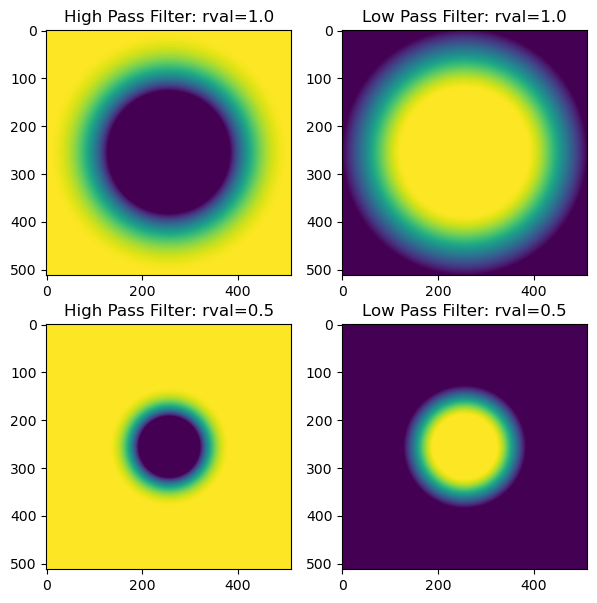

In [86]:
_, ax = plt.subplots(2, 2, figsize=(7, 7))
ax[0, 0].imshow(hi_masks[0]);
ax[0, 0].set_title("High Pass Filter: rval=1.0");

ax[0, 1].imshow(lo_masks[0]);
ax[0, 1].set_title("Low Pass Filter: rval=1.0");

ax[1, 0].imshow(hi_masks[1]);
ax[1, 0].set_title("High Pass Filter: rval=0.5");

ax[1, 1].imshow(lo_masks[1]);
ax[1, 1].set_title("Low Pass Filter: rval=0.5");

#### Get the initial Hi and Low Pass Components

In [87]:
# initial High Pass Component
hi_pass_0 = np.fft.ifft2(np.fft.ifftshift(image_dft * hi_masks[0])).real

# initial Low Pass Component
lo_pass_0 = np.fft.ifft2(np.fft.ifftshift(image_dft * lo_masks[0])).real

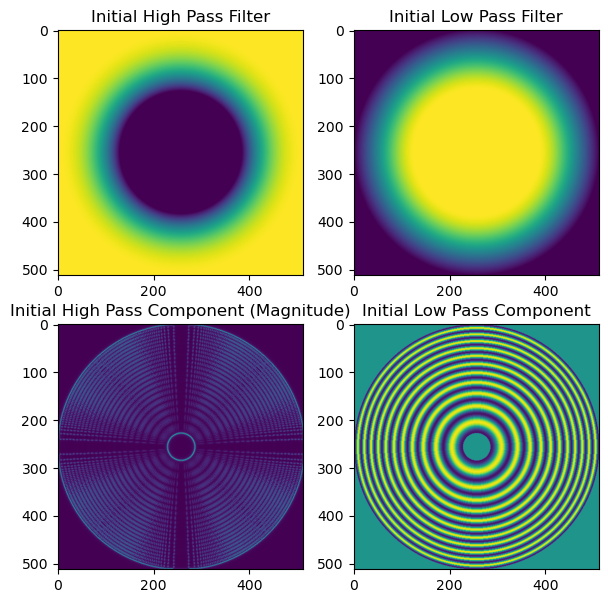

In [92]:
_, ax = plt.subplots(2, 2, figsize=(7, 7))
ax[0, 0].imshow(hi_masks[0]);
ax[0, 0].set_title("Initial High Pass Filter");

ax[0, 1].imshow(lo_masks[0]);
ax[0, 1].set_title("Initial Low Pass Filter");

ax[1, 0].imshow(np.abs(hi_pass_0));
ax[1, 0].set_title("Initial High Pass Component (Magnitude)");

ax[1, 1].imshow(lo_pass_0);
ax[1, 1].set_title("Initial Low Pass Component");

Visualize the effect of the transition width. Go back and change twidth and see how the transition region changes

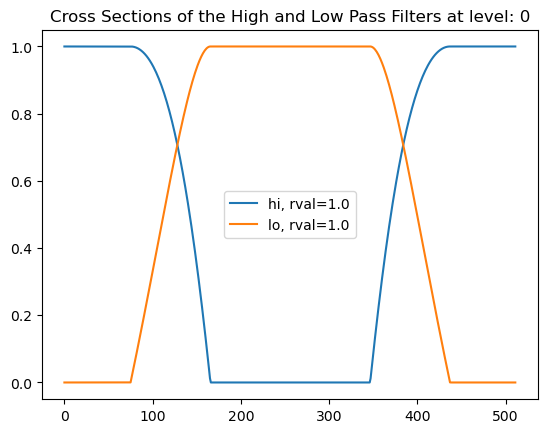

In [66]:
idx = 0
plt.plot(np.diag(hi_masks[idx]), label=f"hi, rval={radial_vals[idx]}")
plt.plot(np.diag(lo_masks[idx]), label=f"lo, rval={radial_vals[idx]}")
plt.title(f"Cross Sections of the High and Low Pass Filters at level: {idx}");
plt.legend();

Get the Radial masks at each level

In [67]:
rad_masks = []
for i in range(1, depth):
    lo_mask_prev = lo_masks[i - 1]
    hi_mask = hi_masks[i]
    rad_mask = hi_mask * lo_mask_prev

    rad_masks.append(rad_mask)

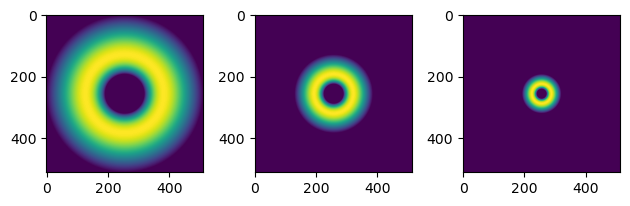

In [70]:
fig, ax = plt.subplots(1, len(rad_masks))
# fig.suptitle("Radial Masks (no orientation)")

for i, rad_mask in enumerate(rad_masks):
    ax[i].imshow(rad_mask)

plt.tight_layout();

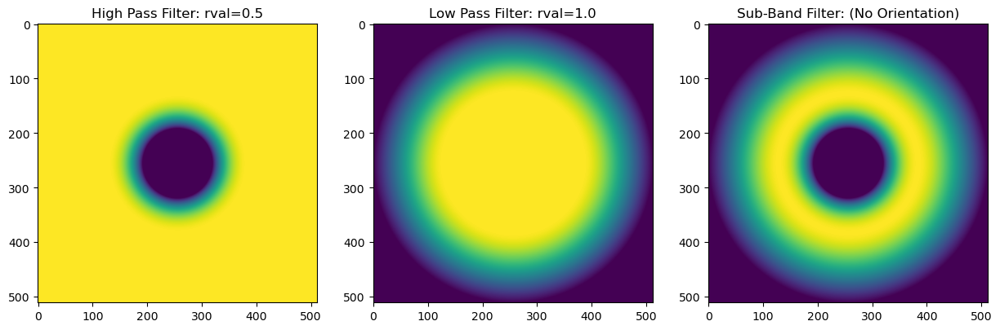

In [69]:
_, ax = plt.subplots(1, 3, figsize=(15, 10))
ax[0].imshow(hi_masks[1])
ax[0].set_title("High Pass Filter: rval=0.5")

ax[1].imshow(lo_masks[0])
ax[1].set_title("Low Pass Filter: rval=1.0")

ax[2].imshow(hi_masks[1] * lo_masks[0])
ax[2].set_title("Sub-Band Filter: (No Orientation)");

Get Angle Masks for a single orientation

In [72]:
from scipy.special import factorial


def _get_angle_mask(angle, b, orientations):
    """ Obtains Angle Mask 
        Inputs:
            angle - Angular component of polar coordinate grid
            b - bth band or orientation
        Outputs:
            angle_mask - Angular mask
        """
    order = orientations - 1
    const = np.power(2, (2*order)) * np.power(factorial(order), 2)/(orientations*factorial(2*order))
    angle = np.mod(np.pi + angle - np.pi*b/orientations, 2*np.pi) - np.pi
    angle_mask = np.abs(2*np.sqrt(const) * np.power(np.cos(angle), order))

    return angle_mask

In [73]:
angle_masks = []

for b in range(4):
    angle_masks.append(_get_angle_mask(angle, b, orientations=4))

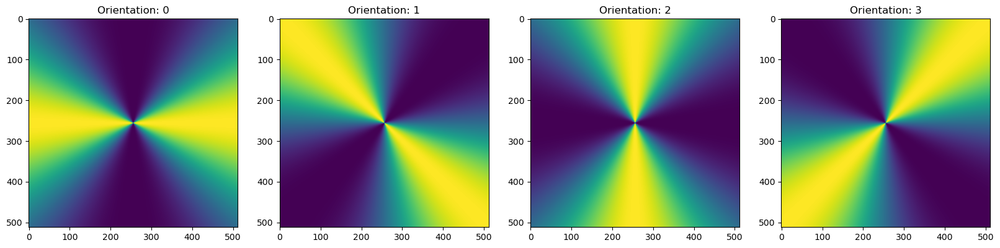

In [74]:
_, ax = plt.subplots(1, 4, figsize=(20, 10))
for i in range(4):
    ax[i].imshow(angle_masks[i])
    ax[i].set_title(f"Orientation: {i}");

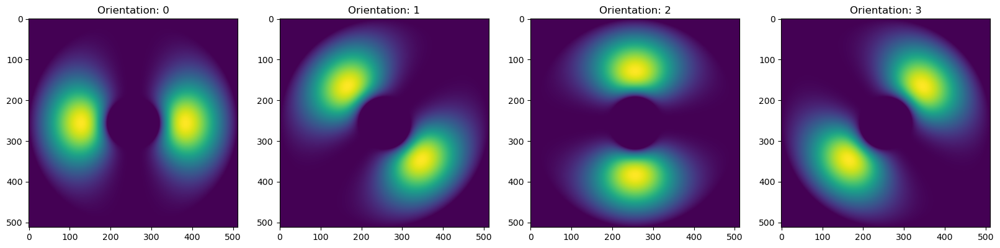

In [31]:
_, ax = plt.subplots(1, 4, figsize=(20, 10))
for i in range(4):
    ax[i].imshow(angle_masks[i] * rad_masks[0])
    ax[i].set_title(f"Orientation: {i}");

Display Freuqency Domain Rresponses of the Steerable Pyramid

In [77]:
# freq_pyramid = pyr.build_pyramid(image, filters, crops, freq=True)
freq_pyramid = pyr.build_pyramid_full(image, filters, freq=True)

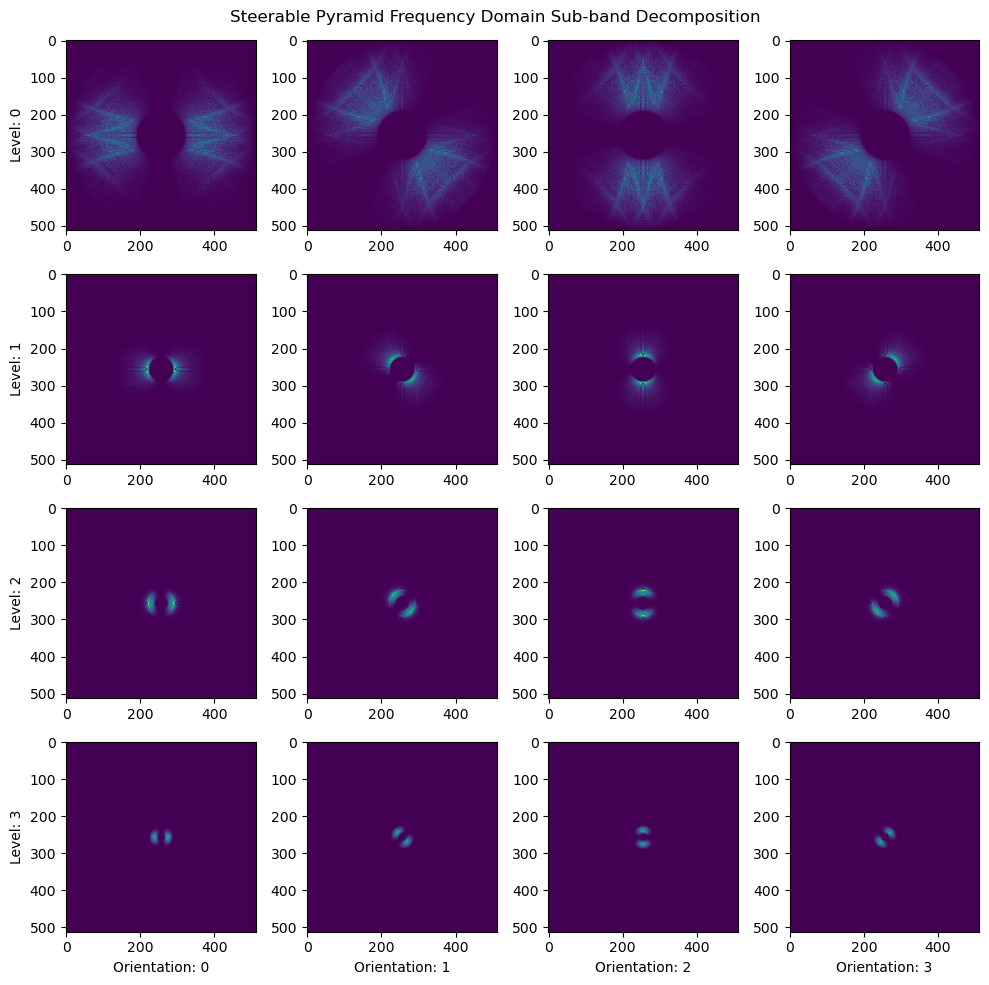

In [78]:
fig, ax = plt.subplots(pyr.depth, pyr.orientations, figsize=(10,10))
fig.suptitle("Steerable Pyramid Frequency Domain Sub-band Decomposition")

idx = 0
for i in range(pyr.num_filts):
    idx = i*pyr.orientations
    for j in range(1, pyr.orientations + 1):
        jdx = idx + j
        ax[i][j - 1].imshow(np.abs(freq_pyramid[jdx]))

ax[0, 0].set_ylabel("Level: 0")
ax[1, 0].set_ylabel("Level: 1")
ax[2, 0].set_ylabel("Level: 2")
ax[3, 0].set_ylabel("Level: 3")

ax[3, 0].set_xlabel("Orientation: 0")
ax[3, 1].set_xlabel("Orientation: 1")
ax[3, 2].set_xlabel("Orientation: 2")
ax[3, 3].set_xlabel("Orientation: 3");


plt.tight_layout();

Display Spatial Domain Responses of the Steerable Pyramid

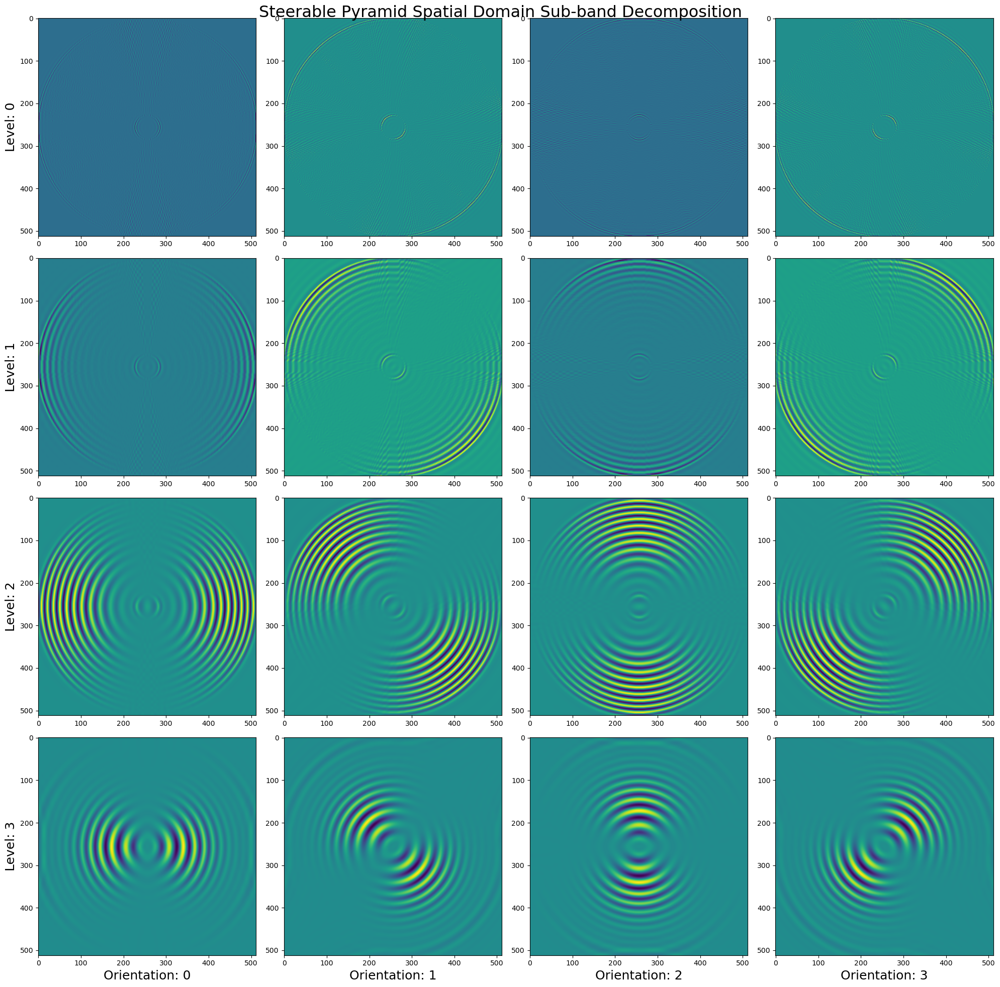

In [79]:
fig, ax = plt.subplots(pyr.depth, pyr.orientations, figsize=(20, 20))
fig.suptitle("Steerable Pyramid Spatial Domain Sub-band Decomposition", size=23)

idx = 0
for i in range(pyr.num_filts):
    idx = i*pyr.orientations
    for j in range(1, pyr.orientations + 1):
        jdx = idx + j
        ax[i][j - 1].imshow(pyramid[jdx])

ax[0, 0].set_ylabel("Level: 0", size=18)
ax[1, 0].set_ylabel("Level: 1", size=18)
ax[2, 0].set_ylabel("Level: 2", size=18)
ax[3, 0].set_ylabel("Level: 3", size=18)

ax[3, 0].set_xlabel("Orientation: 0", size=18)
ax[3, 1].set_xlabel("Orientation: 1", size=18)
ax[3, 2].set_xlabel("Orientation: 2", size=18)
ax[3, 3].set_xlabel("Orientation: 3", size=18);


plt.tight_layout();

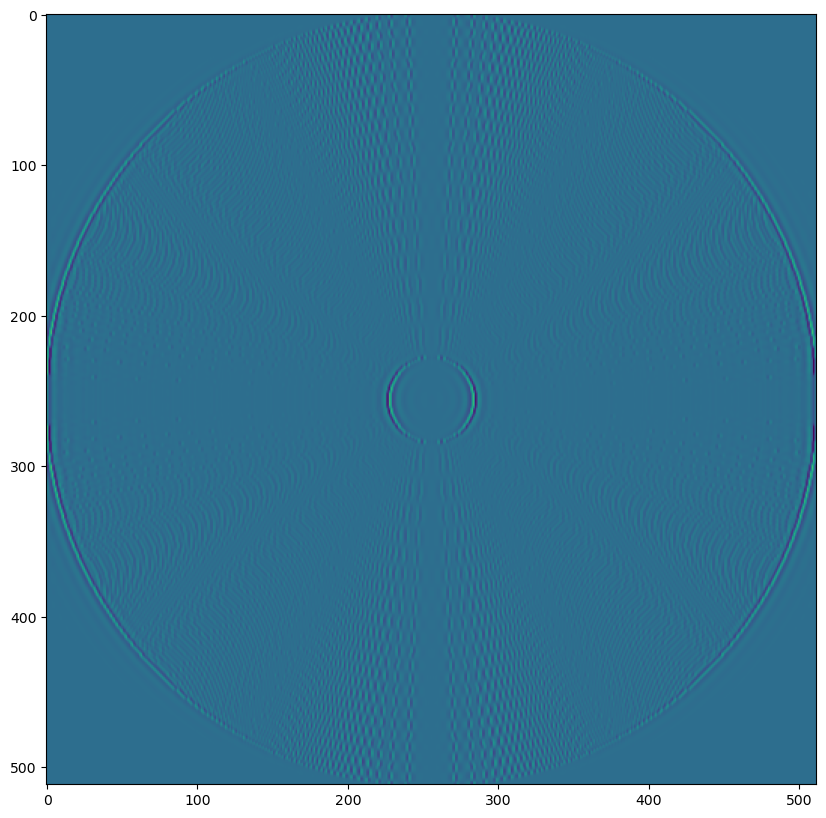

In [83]:
plt.figure(figsize=(10, 10))
plt.imshow(pyramid[1]);